In [ ]:
# Import necessary libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import random
from keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

warnings.filterwarnings('ignore')

In [ ]:
# download and unzip the file consisting the dataset
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

In [ ]:
# Initialize lists to store image paths and labels

input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))

In [ ]:
# Removing invalid image paths

invalid_images = ['PetImages/Cat/666.jpg', 'PetImages/Cat/Thumbs.db', 'PetImages/Dog/Thumbs.db', 'PetImages/Dog/11702.jpg']
input_path = [path for path in input_path if path not in invalid_images]

In [ ]:
# Initialize lists to store image paths and labels

input_path = []
label = []

# Iterate through the subdirectories in the image directory and append image paths along with their labels to input_path and label lists respectively.
for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Dog/9347.jpg 1


In [ ]:
# Create a DataFrame with image paths and labels, shuffle the DataFrame, and reset index.

df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/7257.jpg,0
1,PetImages/Cat/3735.jpg,0
2,PetImages/Cat/10125.jpg,0
3,PetImages/Dog/9942.jpg,1
4,PetImages/Cat/10157.jpg,0


In [ ]:
# Checking for image paths that do not end with '.jpg' and printing them.

for i in df['images']:
    if '.jpg' not in i:
        print(i)


PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [ ]:
# Attempt to open each image using PIL.Image.open() and store paths of images that raise exceptions in a list.

import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Cat/Thumbs.db',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/11702.jpg']

In [ ]:
# Filtering out specific image paths from the DataFrame where images are considered invalid, and getting the length of the DataFrame.


df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

In [ ]:
# Adding import statement

import matplotlib.pyplot as plt  # Add this import statement


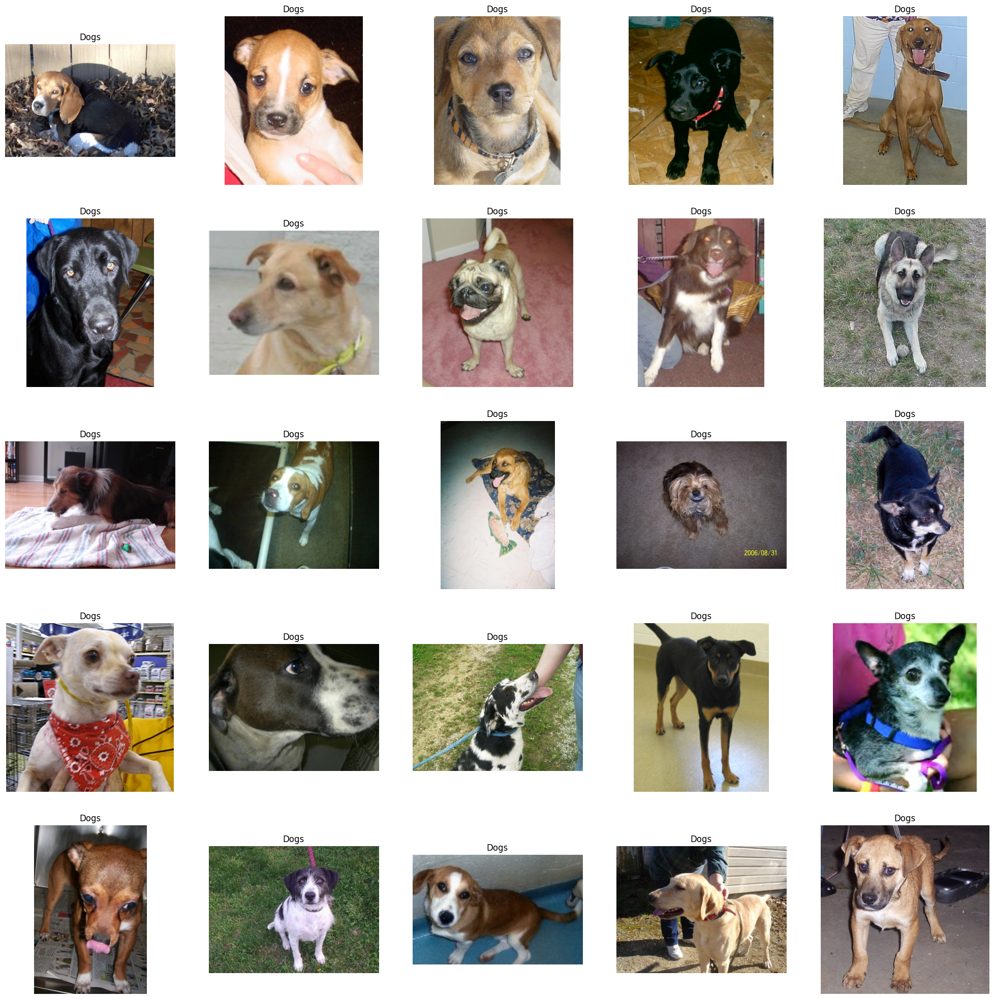

In [ ]:
# Plot a grid of 25 randomly selected dog images from the DataFrame.

plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

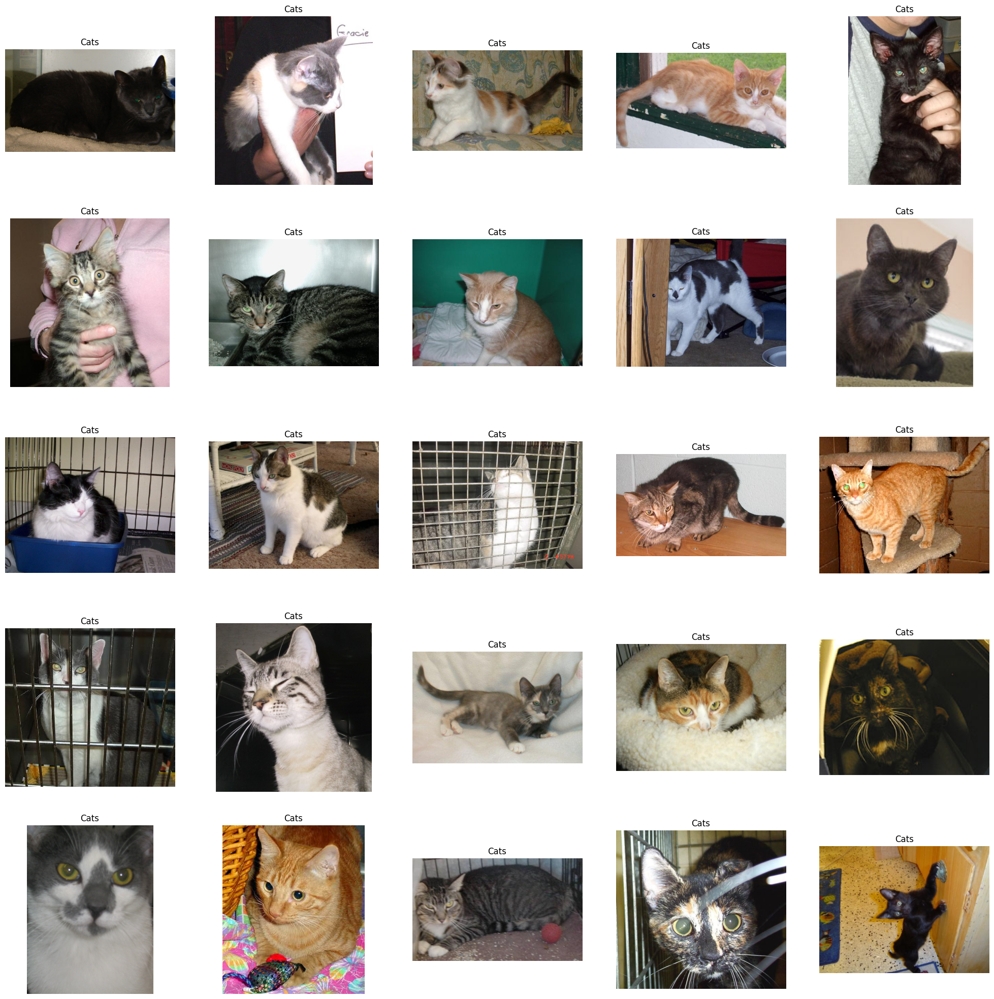

In [ ]:
# Plot a grid of 25 randomly selected cat images from the DataFrame.

plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

In [ ]:
# Split the DataFrame into training and testing sets

train, test = train_test_split(df, test_size=0.2, random_state=42)


In [ ]:
# Creating image data generators for training and validation sets with specified augmentation parameters.


train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)


In [ ]:
# Converting the label column in the DataFrame to string data type.


df['label'] = df['label'].astype('str')



In [ ]:
# Displaying the first few rows of the DataFrame.


df.head()

,images,label
0,PetImages/Cat/7257.jpg,0
1,PetImages/Cat/3735.jpg,0
2,PetImages/Cat/10125.jpg,0
3,PetImages/Dog/9942.jpg,1
4,PetImages/Cat/10157.jpg,0


In [ ]:
#Additional Step: Experiment with Different Architectures
# Define a function to create different model architectures

def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
        MaxPool2D((2,2)),
        Conv2D(64, (3,3), activation='relu'),
        MaxPool2D((2,2)),
        Conv2D(128, (3,3), activation='relu'),
        MaxPool2D((2,2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
# Hyperparameter Tuning
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
# Defining ImageDataGenerator objects for training and validation data, performing normalization and image augmentation.

from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

# Generate batches of augmented data for training using the flow_from_dataframe method.
train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)


Found 19998 validated image filenames belonging to 2 classes.


In [ ]:
# Generating batches of augmented data for validation using the flow_from_dataframe method.

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 5000 validated image filenames belonging to 2 classes.


In [ ]:
# Defining the convolutional neural network (CNN) model architecture using Keras Sequential API.


from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])



In [ ]:
# Compiling the CNN model with Adam optimizer, binary crossentropy loss function, and accuracy metric.
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Printing the summary of the model architecture.
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        0

In [ ]:
# Split the DataFrame into training, validation, and testing sets

train_val, test = train_test_split(df, test_size=0.2, random_state=42)
train, val = train_test_split(train_val, test_size=0.2, random_state=42)

In [ ]:
# Calculate the number of images in the training, validation, and testing sets, and print the results.

train_samples = len(train)
val_samples = len(val)
test_samples = len(test)

print("Number of images in the training set:", train_samples)
print("Number of images in the validation set:", val_samples)
print("Number of images in the test set:", test_samples)

Number of images in the training set: 15998
Number of images in the validation set: 4000
Number of images in the test set: 5000


In [ ]:

# Train the model using the training data generator for 10 epochs, and validate it using the validation data generator.

history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 466s 11s/step - loss: 0.4503 - accuracy: 0.7881 - val_loss: 0.4412 - val_accuracy: 0.7972
Epoch 2/10
40/40 [==============================] - 460s 11s/step - loss: 0.4452 - accuracy: 0.7928 - val_loss: 0.4198 - val_accuracy: 0.8074
Epoch 3/10
40/40 [==============================] - 448s 11s/step - loss: 0.4408 - accuracy: 0.7949 - val_loss: 0.4469 - val_accuracy: 0.7868
Epoch 4/10
40/40 [==============================] - 447s 11s/step - loss: 0.4260 - accuracy: 0.8054 - val_loss: 0.4140 - val_accuracy: 0.8076
Epoch 5/10
40/40 [==============================] - 455s 11s/step - loss: 0.4246 - accuracy: 0.8014 - val_loss: 0.4098 - val_accuracy: 0.8172
Epoch 6/10
40/40 [==============================] - 452s 12s/step - loss: 0.4084 - accuracy: 0.8126 - val_loss: 0.4038 - val_accuracy: 0.8188
Epoch 7/10
40/40 [==============================] - 454s 11s/step - loss: 0.4000 - accuracy: 0.8186 - val_loss: 0.3776 - val_accuracy: 0.8344
Epoch 

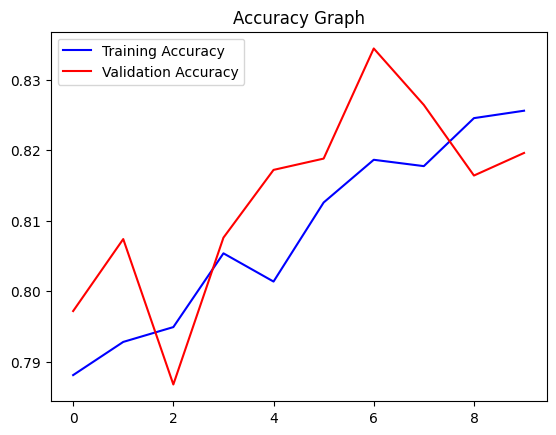

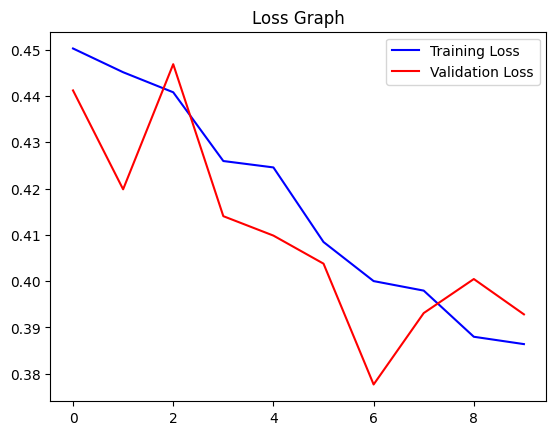

In [ ]:
# Visualization of Results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()